In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import tensorflow_datasets as tfds

import pandas as pd
import numpy as np
from PIL import Image
import shutil
import random
import os
import io




import matplotlib.pyplot as plt
%matplotlib inline

from google.colab import drive
drive.mount('/content/gdrive')

%cd gdrive/MyDrive/Machine_Learning_stuff/celebs/



Mounted at /content/gdrive
/content/gdrive/MyDrive/Machine_Learning_stuff/celebs


In [ ]:
batch_size = 32
img_height = 256
img_width = 256
RAW_SUNGLASSES_DIR='./sunglasses_classifier/sunglasses_imgs/raw/'
SUNGLASSES_TFRECORD_DIR= './sunglasses_classifier/data/rec_sunglasses/sunglasses_full_shuffled.tfrecords'
SUNGLASSES_TFRECORD_TEST_DIR = './sunglasses_classifier/data/rec_sunglasses/train_sample/test.tfrecords'
SEED=42

<h2><u>Inspecting the dataset<u><h2>

In [ ]:
!pip install --user virtualenv

In [ ]:
!virtualenv celebenv

Using base prefix '/Users/dariyankhan/anaconda3'
New python executable in /Users/dariyankhan/OneDrive - Imperial College London/Work (one drive)/Machine Learning/project_for_applications/celebs/celebenv/bin/python
Installing setuptools, pip, wheel...
done.


In [ ]:
!source myenv/bin/activate

In [ ]:
!python -m ipykernel install --user --name=myenv

In [ ]:
import os, os.path

# See how many images we have
print(len(os.listdir('./img_align_celeba')))


202599


We can see that we have 202,599 images. Initially, I will just work with 100 images
to make sure that I have everything working and then I will work with more data. We separate these 100 images below

In [ ]:
#Create new directory
!mkdir 'hundred_imgs_train'
!ls

Anno               celeb.ipynb        hundred_imgs_train img_align_celeba


In [ ]:
#move first hundered images in img_align_celeba dataset into new directory
import shutil

for file_name in os.listdir('./img_align_celeba')[:100]:
    shutil.copyfile('./img_align_celeba' + '/{}'.format(file_name), './hundred_imgs_train' + '/{}'.format(file_name))

In [ ]:
!pip install matplotlib

     |████████████████████████████████| 7.2 MB 2.9 MB/s eta 0:00:01
     |████████████████████████████████| 61 kB 12.3 MB/s eta 0:00:01
     |████████████████████████████████| 2.9 MB 18.5 MB/s eta 0:00:01
  Using cached cycler-0.10.0-py2.py3-none-any.whl (6.5 kB)


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

000057.jpg


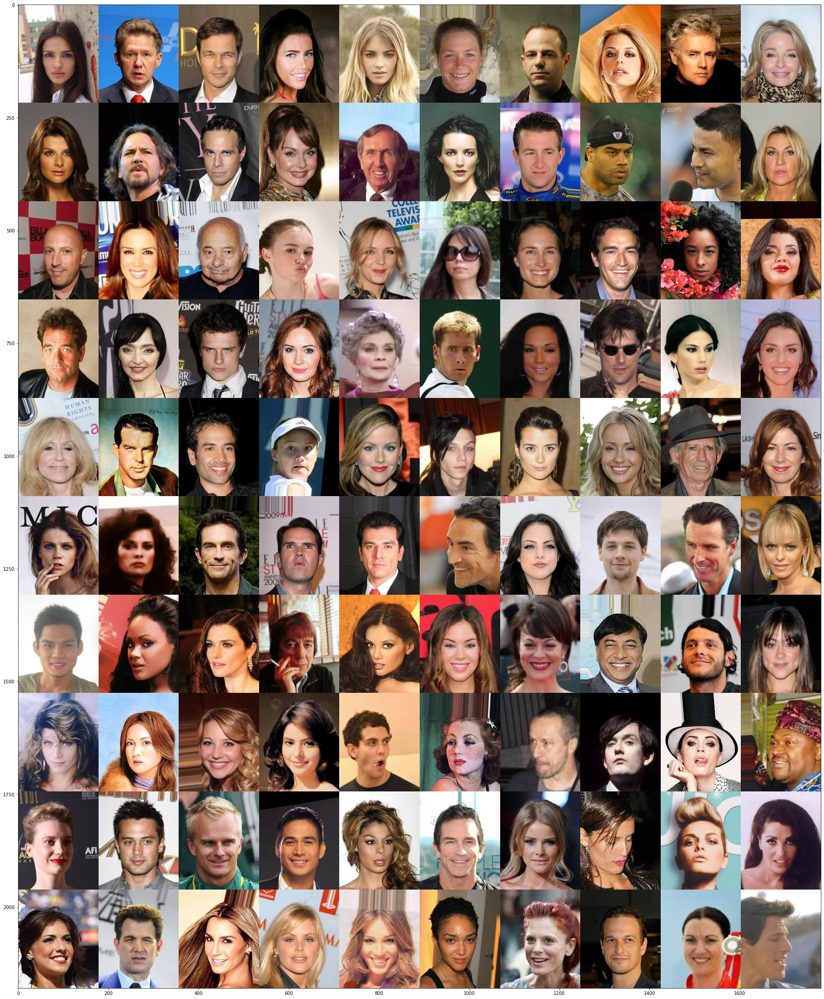

In [ ]:
from PIL import Image

#Load images into an array
def loadImages(path):
    # return array of images

    imagesList = os.listdir(path)
    print(imagesList[38])
    #print(new_img_list)
    
    loadedImages = []
    for image in imagesList:
        img = Image.open(path + image)
        loadedImages.append(img)

    return loadedImages

path = './hundred_imgs_train/'

# images in an array
imgs = loadImages(path)

#Puts the array of images onto a grid
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

grid = image_grid(imgs, rows=10, cols=10)

#Display grid image inline

import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

plt.figure(figsize=(40,40))
plt.imshow(np.asarray(grid))



#for img in imgs:
    # you can show every image
 #   img.show()

We can see that some people are not looking directly at the camera and some are wearing sunglasses. There are also more minor differences such as the presence of a shadow etc. We will remove the people with sunglasses from the dataset, however, we can train a classifier on them to notify the user if they are wearing sunglasses too.

First, let's load in the two CSVs, one with  information about the features present and the other with information about the location of facial features

In [ ]:
import pandas as pd
#load features present dataset into a pandas dataframe

desc_df = pd.read_csv('./Anno/list_attr_celeba.txt',sep='\n',header=None)#pd.read_table('./Anno/list_attr_celeba.txt')
    
desc_df.head(10)

,0
0,name 5_o_Clock_Shadow Arched_Eyebrows Attracti...
1,000001.jpg -1 1 1 -1 -1 -1 -1 -1 -1 -1 -1 1...
2,000002.jpg -1 -1 -1 1 -1 -1 -1 1 -1 -1 -1 1...
3,000003.jpg -1 -1 -1 -1 -1 -1 1 -1 -1 -1 1 -1...
4,000004.jpg -1 -1 1 -1 -1 -1 -1 -1 -1 -1 -1 -1...
5,000005.jpg -1 1 1 -1 -1 -1 1 -1 -1 -1 -1 -1...
6,000006.jpg -1 1 1 -1 -1 -1 1 -1 -1 -1 -1 1...
7,000007.jpg 1 -1 1 1 -1 -1 1 1 1 -1 -1 -1 ...
8,000008.jpg 1 1 -1 1 -1 -1 1 -1 1 -1 -1 -1 ...
9,000009.jpg -1 1 1 -1 -1 1 1 -1 -1 -1 -1 -1...


In [ ]:
#We now need to split the above dataframe by spaces and then make the first row the 'index row'
desc_df_split=desc_df[0].str.split(expand=True)
desc_df_split=desc_df_split.rename(columns=desc_df_split.iloc[0])
desc_df_split.drop(index=desc_df_split.index[0],axis=0,inplace=True)
desc_df_split


,name,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
1,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
2,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
3,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
4,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
5,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202595,202595.jpg,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
202596,202596.jpg,-1,-1,-1,-1,-1,1,1,-1,-1,...,-1,1,1,-1,-1,-1,-1,-1,-1,1
202597,202597.jpg,-1,-1,-1,-1,-1,-1,-1,-1,1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
202598,202598.jpg,-1,1,1,-1,-1,-1,1,-1,1,...,-1,1,-1,1,1,-1,1,-1,-1,1


In [ ]:
#now load features location dataset

loc_df = pd.read_csv('./Anno/list_landmarks_align_celeba.txt',sep='\n',header=None)
loc_df.head(10)

,0
0,name lefteye_x lefteye_y righteye_x righteye_y...
1,000001.jpg 69 109 106 113 77 142 73 1...
2,000002.jpg 69 110 107 112 81 135 70 1...
3,000003.jpg 76 112 104 106 108 128 74 1...
4,000004.jpg 72 113 108 108 101 138 71 1...
5,000005.jpg 66 114 112 112 86 119 71 1...
6,000006.jpg 71 111 106 110 94 131 74 1...
7,000007.jpg 70 112 108 111 85 135 72 1...
8,000008.jpg 71 110 106 111 84 137 73 1...
9,000009.jpg 68 113 110 111 97 139 66 1...


In [ ]:
loc_df_split=loc_df[0].str.split(expand=True)
loc_df_split=loc_df_split.rename(columns=loc_df_split.iloc[0])
loc_df_split.drop(index=loc_df_split.index[0],axis=0,inplace=True)
loc_df_split

,name,lefteye_x,lefteye_y,righteye_x,righteye_y,nose_x,nose_y,leftmouth_x,leftmouth_y,rightmouth_x,rightmouth_y
1,000001.jpg,69,109,106,113,77,142,73,152,108,154
2,000002.jpg,69,110,107,112,81,135,70,151,108,153
3,000003.jpg,76,112,104,106,108,128,74,156,98,158
4,000004.jpg,72,113,108,108,101,138,71,155,101,151
5,000005.jpg,66,114,112,112,86,119,71,147,104,150
...,...,...,...,...,...,...,...,...,...,...,...
202595,202595.jpg,69,111,108,111,89,140,73,151,104,153
202596,202596.jpg,67,112,110,112,85,141,66,150,110,150
202597,202597.jpg,69,111,107,111,92,137,68,151,109,153
202598,202598.jpg,69,111,108,111,90,137,71,153,106,151


Let's count the number of people wearing sunglasses:

In [ ]:
#Put frist 100 images into their own csv, just so I can open it in Excel to make some checks
desc_hundred=desc_df_split.head(100)
desc_hundred.to_csv(r'./desc_hundred.csv', index = False, header = True, sep=',')

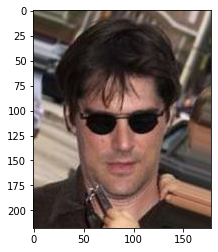

In [ ]:
#Make sure that Eyeglasses definitely means sunglasses
img_test = Image.open('./hundred_imgs_train/' + '000053.jpg')
plt.imshow(np.asarray(img_test))

In [ ]:
#Lets get a list of images with sunglasses
sunglass_img_list=[desc_df_split['name'].iloc[el] for el in range(len(desc_df_split.index)) if desc_df_split['Eyeglasses'].iloc[el]=='1']

In [ ]:
len(sunglass_img_list)
sunglass_img_list[0]

'000053.jpg'

We have 13,193 sunglasses images, which is more than enough to train a classifier. So, let's put these images in a different directory.

<h2><u>Prepare the sunglass dataset<u><h2>

In [ ]:
#!mkdir 'sunglasses_classifier'
#!mkdir './sunglasses_classifier/sunglasses_imgs'
#!mkdir './sunglasses_classifier/no_sunglasses_imgs'

import shutil
for file_name in sunglass_img_list:
    shutil.copyfile('./img_align_celeba' + '/{}'.format(file_name), './sunglasses_classifier/sunglasses_imgs' + '/{}'.format(file_name))


Now we need to randomly choose images from the celeb dataset without glasses

In [ ]:
no_glasses_imgs=[x for x in os.listdir('./img_align_celeba') if (('.jpg' in x) and (x not in sunglass_img_list))]

In [ ]:
len(no_glasses_imgs) #Check if it is the correct length

189406

In [ ]:
#randomly select 13,193 images
import random
random.seed(42)

rndm_no_glasses_imgs=random.sample(no_glasses_imgs, 13193)

print(len(rndm_no_glasses_imgs))




13193


In [ ]:
print(rndm_no_glasses_imgs[0])

003118.jpg


In [ ]:
#Move images to the correct directory
for file_name in rndm_no_glasses_imgs:
    shutil.copyfile('./img_align_celeba' + '/{}'.format(file_name), './sunglasses_classifier/no_sunglasses_imgs' + '/{}'.format(file_name))



<h2><u> Load sunglasses images <u><h2>

In [ ]:
batch_size = 32
img_height = 256
img_width = 256
sunglasses_dir='./sunglasses_classifier/sunglasses_imgs/raw'
SEED=42

In [ ]:
#Get training set
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  sunglasses_dir,
  validation_split=0.2,
  subset="training",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=32)

Found 26386 files belonging to 2 classes.
Using 21109 files for training.


In [ ]:
#Get validation set
test_ds=tf.keras.preprocessing.image_dataset_from_directory(
  sunglasses_dir,
  validation_split=0.2,
  subset="validation",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=32)

Found 26386 files belonging to 2 classes.
Using 5277 files for validation.


In [ ]:
#Check class names
class_names = train_ds.class_names
print(class_names)

['1-sunglasses', 'no_sunglasses']


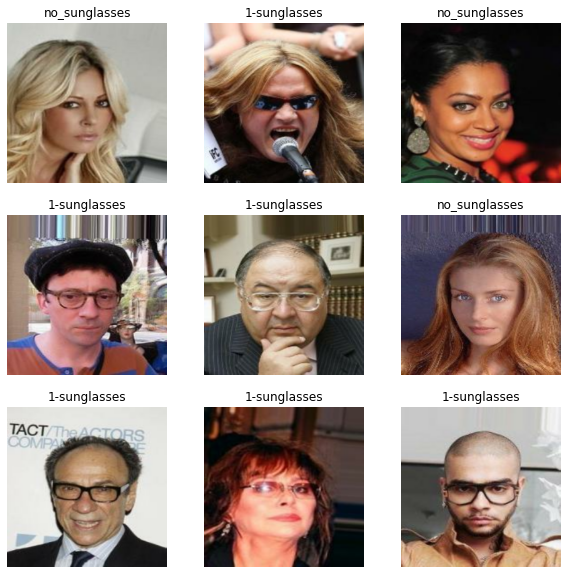

In [ ]:
#Plot figures to make sure we have everything correct
import matplotlib.pyplot as plt
%matplotlib inline
import sys




plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    #print(type(labels))
    #print(labels)
    #print(class_names[labels.numpy()[0]])
    plt.title(class_names[labels[i]])
    plt.axis("off")

<h2><u> Train a preliminary model on a subset of 200 images <u><h2>

I will now train a CNN model without any hyperparameter tuning on only 1000 images to make sure my code is correct and to get a rough baseline of baseline performance

In [ ]:
#num items
total_prelim_train_items=1000
total_prelim_test_items=250

prelim_train_items= int(total_prelim_train_items/batch_size)
prelim_test_items=int(total_prelim_test_items/batch_size)

train_thousand_ds= train_ds.take(prelim_train_items)
test_thousand_ds=test_ds.take(prelim_test_items)

In [ ]:
tf.data.experimental.cardinality(train_thousand_ds)

<tf.Tensor: shape=(), dtype=int64, numpy=31>

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
num_classes = 2

prelim_model = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [ ]:
#del prelim_model

In [ ]:
prelim_model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
prelim_model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_5 (Rescaling)      (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 128, 128, 32)      4640      
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 64, 64)        18496     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 32, 32, 64)       

In [ ]:
epochs=20
prelim_history = prelim_model.fit(
  train_thousand_ds,
  validation_data=test_thousand_ds,
  epochs=epochs
)

Epoch 1/20
31/31 [==============================] - 25s 795ms/step - loss: 0.7971 - accuracy: 0.6179 - val_loss: 0.5938 - val_accuracy: 0.7188
Epoch 2/20
31/31 [==============================] - 24s 776ms/step - loss: 0.4219 - accuracy: 0.8105 - val_loss: 0.3581 - val_accuracy: 0.8348
Epoch 3/20
31/31 [==============================] - 24s 768ms/step - loss: 0.2248 - accuracy: 0.9073 - val_loss: 0.2122 - val_accuracy: 0.9196
Epoch 4/20
31/31 [==============================] - 25s 795ms/step - loss: 0.1275 - accuracy: 0.9567 - val_loss: 0.1381 - val_accuracy: 0.9554
Epoch 5/20
31/31 [==============================] - 25s 792ms/step - loss: 0.0829 - accuracy: 0.9768 - val_loss: 0.1170 - val_accuracy: 0.9554
Epoch 6/20
31/31 [==============================] - 25s 794ms/step - loss: 0.0515 - accuracy: 0.9808 - val_loss: 0.1676 - val_accuracy: 0.9464
Epoch 7/20
31/31 [==============================] - 24s 772ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.1967 - val_accuracy: 0.9464

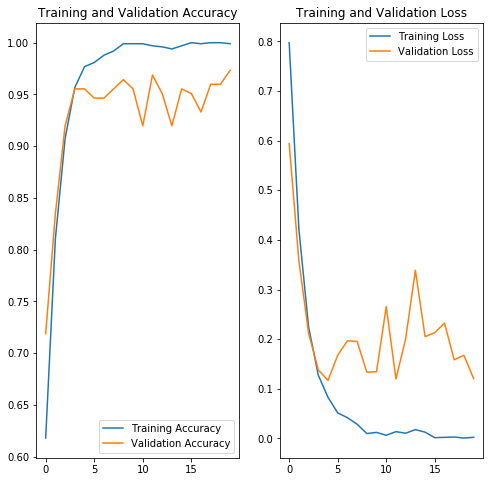

<Figure size 432x288 with 0 Axes>

In [ ]:
train_acc = prelim_history.history['accuracy']
test_acc = prelim_history.history['val_accuracy']

loss = prelim_history.history['loss']
test_loss = prelim_history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, test_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, test_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()
plt.savefig(sunglasses_dir, dpi=300)

We can see that our model achieved a 99.9% accuracy on the test set and a 97.32% accuracy on the train set however, we trained and tested on a very small subset. Next I will implement hyper-parameter tuning on the whole dataset, as well as program the model in a way that could scale easily, by using tfx

In [ ]:
prelim_model.save(sunglasses_dir+'prelim_model',save_format='tf')

INFO:tensorflow:Assets written to: ./sunglasses_classifier/prelim_model/assets


<h2><u> Train entire dataset as test<h2><u>


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
num_classes = 2

test_whole_model = Sequential([
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [ ]:
test_whole_model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
epochs=10
test_whole_model_history = test_whole_model.fit(
  train_ds,
  validation_data=test_ds,
  epochs=epochs
)

Epoch 1/10
660/660 [==============================] - 261s 390ms/step - loss: 0.1592 - accuracy: 0.9314 - val_loss: 0.0765 - val_accuracy: 0.9773
Epoch 2/10
660/660 [==============================] - 204s 310ms/step - loss: 0.0632 - accuracy: 0.9802 - val_loss: 0.1095 - val_accuracy: 0.9697
Epoch 3/10
660/660 [==============================] - 204s 309ms/step - loss: 0.0443 - accuracy: 0.9861 - val_loss: 0.0644 - val_accuracy: 0.9793
Epoch 4/10
660/660 [==============================] - 204s 309ms/step - loss: 0.0326 - accuracy: 0.9890 - val_loss: 0.0760 - val_accuracy: 0.9793
Epoch 5/10
660/660 [==============================] - 203s 308ms/step - loss: 0.0213 - accuracy: 0.9927 - val_loss: 0.1044 - val_accuracy: 0.9778
Epoch 6/10
660/660 [==============================] - 203s 307ms/step - loss: 0.0175 - accuracy: 0.9945 - val_loss: 0.1022 - val_accuracy: 0.9782
Epoch 7/10
660/660 [==============================] - 202s 306ms/step - loss: 0.0129 - accuracy: 0.9955 - val_loss: 0.1368 -

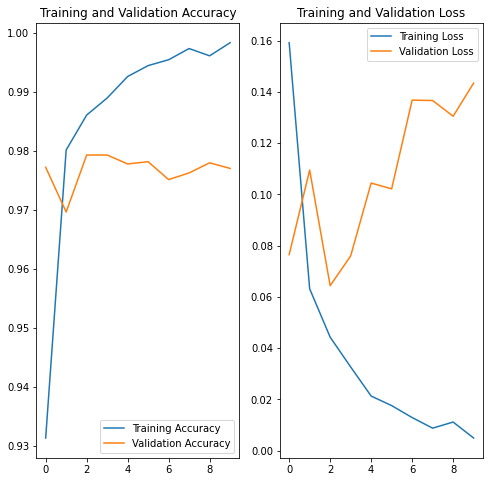

<Figure size 432x288 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
train_acc = test_whole_model_history.history['accuracy']
test_acc = test_whole_model_history.history['val_accuracy']

loss = test_whole_model_history.history['loss']
test_loss = test_whole_model_history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, test_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, test_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()
plt.savefig('sunglasses_classifier/full_glass_test', dpi=300)

In [ ]:
test_whole_model.save('sunglasses_classifier/models/test_whole_model',save_format='tf')

INFO:tensorflow:Assets written to: sunglasses_classifier/models/test_whole_model/assets


<h2><u>Train whole dataset<h2><u>

In [ ]:
num_test_batches=tf.data.experimental.cardinality(test_ds)

In [ ]:
#Split test set into val and test set, including prefetching

test_ds=test_ds.shuffle(buffer_size=32,seed=SEED)
val_ds=test_ds.take(num_test_batches//2)#.prefetch(tf.data.experimental.AUTOTUNE)
test_ds=test_ds.skip(num_test_batches//2)#.prefetch(tf.data.experimental.AUTOTUNE)

assert ((val_ds!= test_ds) and (tf.data.experimental.cardinality(val_ds)==tf.data.experimental.cardinality(val_ds)))



In [ ]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds

'\nimport os\nimport pprint\n\nimport tfx\nfrom tfx.components import ImportExampleGen\nfrom tfx.components import ExampleValidator\nfrom tfx.components import SchemaGen\nfrom tfx.components import StatisticsGen\nfrom tfx.components import Transform\nfrom tfx.components import Tuner\nfrom tfx.components import Trainer\n\nfrom tfx.proto import example_gen_pb2\nfrom tfx.orchestration.experimental.interactive.interactive_context import InteractiveContext\n'

In [ ]:
# Location of the pipeline metadata store
_pipeline_root = sunglasses_dir + 'pipeline/'

# Directory of the raw TFRecord data files
_data_root = sunglasses_dir + './data/rec_sunglasses'

NameError: ignored

In [ ]:
# Create the dataset directory
#!mkdir -p {_data_root}

# Create the TFX pipeline files directory
#!mkdir {_pipeline_root}

In [ ]:
# Define the location of the train tfrecord downloaded via TFDS
tfds_data_path = f'{sunglasses_dir}/info/ver1'

# Display contents of the TFDS data directory
os.listdir(tfds_data_path)

FileNotFoundError: [Errno 2] No such file or directory: './sunglasses_classifier//info/ver1'

<h3><u>A helper function that turns a dataset to a TFRecord <u><h3>

In [ ]:
#First get train and test sets unbatched
#Get training set
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  sunglasses_dir,
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=1)


'''
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  sunglasses_dir,
  validation_split=0,
  subset="training",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=1)
'''

#Get validation set
'''
test_ds=tf.keras.preprocessing.image_dataset_from_directory(
  sunglasses_dir,
  validation_split=0.00001,
  subset="validation",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=1)

'''

#train_thousand_ds= train_ds.take(40)
#test_thousand_ds=test_ds.take(1)




Found 26386 files belonging to 2 classes.


'\ntest_ds=tf.keras.preprocessing.image_dataset_from_directory(\n  sunglasses_dir,\n  validation_split=0.00001,\n  subset="validation",\n  seed=SEED,\n  image_size=(img_height, img_width),\n  batch_size=1)\n\n'

In [ ]:
# Define filename for train record
TFRECORD_FILE_TRAIN_PATH = './sunglasses_classifier/data/rec_sunglasses/train_full_{}.tfrecord'
IMAGE_KEY='image'
LABEL_KEY='label'

In [ ]:
#Define filename for test record
TFRECORD_FILE_VAL_SAMPLE = 'sunglasses_val_sample.tfrecord'

In [ ]:
def sunglasses_ds_to_tfrecord(dataset, tfrecord_file):
  ''' Helper function to convert a TF Dataset to TFRecord

  Args:
    dataset (TF Dataset) - dataset to save as TFRecord
    tfrecord_file (string) - filename to use when writing the TFRecord
  '''

  # Initialize examples list
  examples = []

  for row in dataset:
    # Get image, label, and group tensors
    #print(row.shape)
    image = row[0]
    #print(image.shape)
    label = row[1]
    #print(label.shape)

    # Flatten image
    image = tf.reshape(image, [-1])

    # Instantiate Example
    output = tf.train.Example()

    # Assign features' numpy arrays to the Example feature values
    output.features.feature[IMAGE_KEY].float_list.value.extend(image.numpy().tolist())
    output.features.feature[LABEL_KEY].float_list.value.append(label.numpy())
    #output.features.feature[GROUP_KEY].bytes_list.value.append(b"Young" if group.numpy() else b'Not Young')
    
    # Append to examples list
    examples.append(output)

  # Serialize examples and save as tfrecord
  with tf.io.TFRecordWriter(tfrecord_file) as writer:
    for example in examples:
      writer.write(example.SerializeToString())

3

In [ ]:
train_ds_cardinality=train_ds.cardinality().numpy
SPLITS=1000
train_ds_quotient=train_ds_cardinality()//SPLITS
train_ds_rem=train_ds_cardinality()%SPLITS
print(train_ds_quotient,train_ds_rem)

26 386


In [ ]:
for i in range(train_ds_quotient):
  sunglasses_ds_to_tfrecord(train_ds.take(SPLITS), TFRECORD_FILE_TRAIN_PATH.format(str(i)))
  train_ds.skip(SPLITS)

sunglasses_ds_to_tfrecord(train_ds.take(train_ds_rem), TFRECORD_FILE_TRAIN_PATH.format(str(i)))

In [ ]:
sunglasses_ds_to_tfrecord(test_thousand_ds, TFRECORD_FILE_VAL_SAMPLE)

In [ ]:
#Inspect tf.record file

import tensorflow as tf 
raw_dataset = tf.data.TFRecordDataset("./sunglasses_classifier/sunglasses_val_sample.tfrecord")

for raw_record in raw_dataset.take(1):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())
    #print(example)

In [ ]:
example

features {
  feature {
    key: "image"
    value {
      float_list {
        value: 228.0
        value: 226.0
        value: 227.0
        value: 228.0
        value: 226.0
        value: 227.0
        value: 227.76171875
        value: 225.76171875
        value: 226.76171875
        value: 227.06640625
        value: 225.06640625
        value: 226.06640625
        value: 227.0
        value: 225.0
        value: 226.0
        value: 227.0
        value: 225.0
        value: 226.0
        value: 227.0
        value: 225.0
        value: 226.0
        value: 227.0
        value: 225.0
        value: 226.0
        value: 227.41015625
        value: 225.41015625
        value: 226.41015625
        value: 228.0
        value: 226.0
        value: 227.0
        value: 228.0
        value: 226.0
        value: 227.0
        value: 227.50390625
        value: 225.50390625
        value: 226.50390625
        value: 227.0
        value: 225.0
        value: 226.0
        value: 227.0
     

In [ ]:
type(x)

tensorflow.python.framework.ops.EagerTensor

(256, 256, 3)
tf.Tensor([0], shape=(1,), dtype=int32)


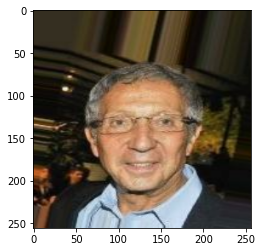

In [ ]:
for x,y in test_ds.take(1):
    img=tf.squeeze(x,axis=0)
    print(img.shape)
    label=y
    
plt.imshow(img.numpy().astype("uint8"))
print(y)

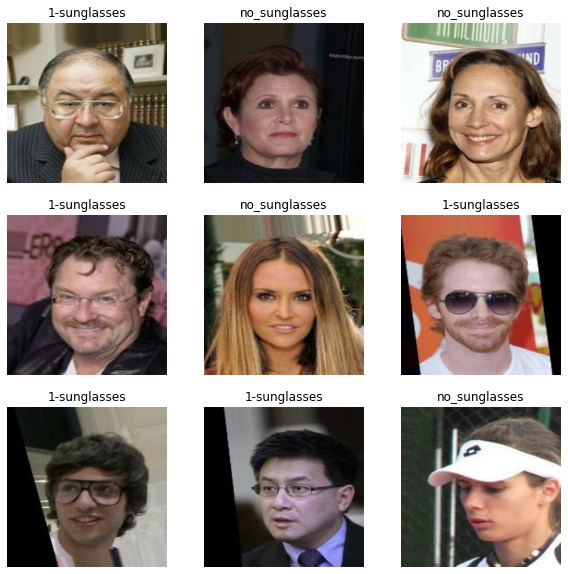

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

<h2><u> Try writing to TFRecord file with tensorflow website info <u><h2>

In [ ]:
# The following functions can be used to convert a value to a type compatible
# with tf.train.Example.

def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
  """Returns a float_list from a float / double."""
  return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))


def image_resize_to_byte_array(image:Image):
  imgByteArr = io.BytesIO()
  image=image.resize((256,256))
  image.save(imgByteArr, format="jpeg")
  imgByteArr = imgByteArr.getvalue()
  return imgByteArr

In [ ]:
# image_labels = {
#     'sunglasses' : 1,
#     'no_sunglasses': 0,
# }
RAW_SUNGLASSES_DIR='./sunglasses_classifier/sunglasses_imgs/raw/'

In [ ]:
#Remove any corrupted files and non jpeg files

#!find ${RAW_SUNGLASSES_DIR} -size 0 -exec rm {} +
#!find ${RAW_SUNGLASSES_DIR} -type f ! -name "*.jpg" -exec rm {} +

In [ ]:
# image_labels={}

# for filename in os.listdir(RAW_SUNGLASSES_DIR + '1-sunglasses'):
#   if '.jpg' in filename:
#     file_path=os.path.join(RAW_SUNGLASSES_DIR,'1-sunglasses',filename)
#     #print(file_path)
#     image_labels[file_path]=1

# for filename in os.listdir(RAW_SUNGLASSES_DIR + 'no_sunglasses'):
#   if '.jpg' in filename:
#     file_path=os.path.join(RAW_SUNGLASSES_DIR,'no_sunglasses',filename)
#     #print(file_path)
#     image_labels[file_path]=0
  
# print(len(image_labels.keys()))

26386


In [ ]:
image_pairs=[]

for filename in os.listdir(RAW_SUNGLASSES_DIR + '1-sunglasses'):
  if '.jpg' in filename:
    file_path=os.path.join(RAW_SUNGLASSES_DIR,'1-sunglasses',filename)
    #print(file_path)
    #image_labels[file_path]=1
    image_pairs.append((file_path,1))

for filename in os.listdir(RAW_SUNGLASSES_DIR + 'no_sunglasses'):
  if '.jpg' in filename:
    file_path=os.path.join(RAW_SUNGLASSES_DIR,'no_sunglasses',filename)
    #print(file_path)
    #image_labels[file_path]=0
    image_pairs.append((file_path,0))

random.Random(SEED).shuffle(image_pairs)

image_labels=dict(image_pairs)




In [ ]:
#image_string_train = open('./sunglasses_classifier/sunglasses_imgs/raw/1-sunglasses/000053.jpg', 'rb').read()

KeyboardInterrupt: ignored

In [ ]:
#label = image_labels['sunglasses']

# Create a dictionary with features that are relevant.
def image_example(image_string, label):
  image_shape = tf.io.decode_jpeg(image_string).shape

  # feature = {
  #     'label': _int64_feature(label),
  #     'image_raw': _bytes_feature(image_string),
  # }

  feature = {
      'image_raw': _bytes_feature(image_string),
      'label': _int64_feature(label),   
  }

  return tf.train.Example(features=tf.train.Features(feature=feature))

In [ ]:
# for line in str(image_example(image_string_train, label)).split('\n')[:15]:
#   print(line)
# print('...')

features {
  feature {
    key: "image_raw"
    value {
      bytes_list {
        value: "\377\330\377\340\000\020JFIF\000\001\001\000\000\001\000\001\000\000\377\333\000C\000\010\006\006\007\006\005\010\007\007\007\t\t\010\n\014\024\r\014\013\013\014\031\022\023\017\024\035\032\037\036\035\032\034\034 $.\' \",#\034\034(7),01444\037\'9=82<.342\377\333\000C\001\t\t\t\014\013\014\030\r\r\0302!\034!22222222222222222222222222222222222222222222222222\377\300\000\021\010\000\332\000\262\003\001\"\000\002\021\001\003\021\001\377\304\000\037\000\000\001\005\001\001\001\001\001\001\000\000\000\000\000\000\000\000\001\002\003\004\005\006\007\010\t\n\013\377\304\000\265\020\000\002\001\003\003\002\004\003\005\005\004\004\000\000\001}\001\002\003\000\004\021\005\022!1A\006\023Qa\007\"q\0242\201\221\241\010#B\261\301\025R\321\360$3br\202\t\n\026\027\030\031\032%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\203\204\205\206\207\210\211\212\222\223\224\225\226\227\230\231\232\242\243\244\245\246\247\

In [ ]:
with tf.io.TFRecordWriter(SUNGLASSES_TFRECORD_DIR) as writer:
  for filepath, label in image_labels.items():
    image_bytes=image_resize_to_byte_array(Image.open(filepath,mode='r'))
    #image_string = open(filepath, 'rb').read()
    tf_example = image_example(image_bytes, label)
    writer.write(tf_example.SerializeToString())

In [ ]:
# import os
# train_full_record_file = './sunglasses_classifier/data/rec_sunglasses/train_full_images_{}.tfrecord'
# train_record_dict=dict()
# for x in os.listdir('./sunglasses_classifier/sunglasses_imgs/raw/1-sunglasses'):
#   if ('.jpg' in x):
#     train_record_dict[x]=1

# for x in os.listdir('./sunglasses_classifier/sunglasses_imgs/raw/no_sunglasses'):
#   if ('.jpg' in x):
#     train_record_dict[x]=0

# #train_full_record_file_imgs_with=[x for x in os.listdir('./sunglasses_classifier/sunglasses_imgs/raw/1-sunglasses') if ('.jpg' in x)] 
# #train_full_record_file_imgs_without=[x for x in os.listdir('./sunglasses_classifier/sunglasses_imgs/raw/no_sunglasses') if ('.jpg' in x)]
# #print(len(train_sample_record_file_imgs))
# assert 26386 == len(train_record_dict.keys())

# import random
# record_keys=list(train_record_dict.keys())
# random.Random(SEED).shuffle(record_keys)

# for index in range(1,28):
#   with tf.io.TFRecordWriter(train_full_record_file.format(str(index))) as writer:

#       if index!=27:
#         upper=index*1000
#       else:
#         upper=26385
#       for filename in record_keys[(i-1)*1000:upper]:
#           #print('count=',count)
#           print(filename)

#           if train_record_dict[filename]==1:
#             glasses_subdir='1-sunglasses'
#           else:
#             glasses_subdir='no_sunglasses'

#           #if (train_record_dict[filename]==0): glasses_subdir='1-sunglasses' else: glasses_subdir='no_sunglasses'
#           image_train_string = open('./sunglasses_classifier/sunglasses_imgs/raw/{}/{}'.format(glasses_subdir,filename), 'rb').read()
#           tf_example = image_example(image_train_string,train_record_dict[filename] )
#           writer.write(tf_example.SerializeToString())
      
#       writer.close()

In [ ]:
# test_sample_record_file = './sunglasses_classifier/test_sample_images.tfrecords'
# with tf.io.TFRecordWriter(test_sample_record_file) as writer:
#   #for filename, label in image_labels.items():
#     image_test_string = open('./sunglasses_classifier/sunglasses_imgs/single_scaled_test/000014.jpg', 'rb').read()
#     tf_example = image_example(image_test_string, 1)
#     writer.write(tf_example.SerializeToString())


<h2><u> Medium article attempt <u><h2>

In [ ]:
def _int64_feature(value):
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

# _bytes is used for string/char values

def _bytes_feature(value):
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))


In [ ]:
tfrecord_filename = 'sunglasses_record_1.tfrecords'

RAW_SUNGLASSES_DIR='./sunglasses_classifier/sunglasses_imgs/raw/'
SUNGLASSES_TFRECORD_DIR= './sunglasses_classifier/data/rec_sunglasses/'

In [ ]:
#get images

#[x for x in os.listdir('./sunglasses_classifier/sunglasses_imgs/raw/1-sunglasses') if ('.jpg' in x)]

sunglasses_imgs= [i for i in os.listdir(RAW_SUNGLASSES_DIR + '1-sunglasses') if ('.jpg' in i)]
no_sunglasses_imgs=[i for i in os.listdir(RAW_SUNGLASSES_DIR + 'no_sunglasses') if ('.jpg' in i)]
print(len(sunglasses_imgs),len(no_sunglasses_imgs))

assert len(sunglasses_imgs) == len(no_sunglasses_imgs)

random.Random(SEED).shuffle(sunglasses_imgs)
random.Random(SEED).shuffle(no_sunglasses_imgs)

writer = tf.io.TFRecordWriter(tfrecord_filename)

for (glasses,no_glasses) in zip(sunglasses_imgs,no_sunglasses_imgs):
  glasses_img=Image.open(os.path.join(RAW_SUNGLASSES_DIR,'1-sunglasses',glasses))
  no_glasses_img = Image.open(os.path.join(RAW_SUNGLASSES_DIR + 'no_sunglasses',no_glasses))
  
  glasses_img=np.array(glasses_img.resize((256,256)))
  no_glasses_img=np.array(no_glasses_img.resize((256,256)))

  glasses_feature = { 'label': _int64_feature(1), 'image': _bytes_feature(glasses_img.tostring()) }
  no_glasses_feature = { 'label': _int64_feature(0), 'image': _bytes_feature(no_glasses_img.tostring()) }

  glasses_example = tf.train.Example(features=tf.train.Features(feature=glasses_feature))
  no_glasses_example = tf.train.Example(features=tf.train.Features(feature=no_glasses_feature))

  writer.write(glasses_example.SerializeToString())
  writer.write(no_glasses_example.SerializeToString())

writer.close()



13193 13193


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.


In [ ]:




# # Initiating the writer and creating the tfrecords file.



# # Loading the location of all files - image dataset
# # Considering our image dataset has apple or orange
# # The images are named as apple01.jpg, apple02.jpg .. , orange01.jpg .. etc.

# images = glob.glob('data/*.jpg')
# for image in images[:1]:
# img = Image.open(image)
# img = np.array(img.resize((32,32)))
# label = 0 if 'apple' in image else 1
# feature = { 'label': _int64_feature(label),
#           'image': _bytes_feature(img.tostring()) }

# # Create an example protocol buffer

# example = tf.train.Example(features=tf.train.Features(feature=feature))

# # Writing the serialized example.

# writer.write(example.SerializeToString())

# writer.close()